# 1. Spatially variable genes identification within slice

In [1]:
%load_ext autoreload
%autoreload

import sys
sys.path.insert(0,"/home/panhailin/software/source/git_hub/spateo-release_add_svg/")
import spateo as st

import pickle

2023-01-10 09:30:27.020002: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-01-10 09:30:27.024381: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/panhailin/miniconda3/envs/spateo/lib/python3.8/site-packages/opencv_python-4.5.5.64-py3.8-linux-x86_64.egg/cv2/../../lib64:
2023-01-10 09:30:27.024393: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
/home/panhailin/miniconda3/envs/spateo/lib/python3.8/site-packages/spaghetti-1.6.5-py3.8.egg/spaghetti/network.py:36: FutureWarning:

The next major release of pysal/spag

|-----> setting visualization default mode in dynamo. Your customized matplotlib settings might be overritten.


## Read in the imputated adata

SVGs idnetification can be done on any kind of data, here we use smoothed data to display how to identify SVGs. Smoothed data can be generated by st.svg.imputataion() function. Input file can be downloaded from: XXX

In [2]:
e16_sm = st.read_h5ad('E16.5.smooth.h5ad')
e16_sm

AnnData object with n_obs × n_vars = 13391 × 10814
    obs: 'area', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'Size_Factor', 'initial_cell_size', 'louvain', 'group_anno'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'gene_highly_variable', 'use_for_pca'
    uns: 'X_pca_neighbors', '__type', 'louvain', 'louvain_colors', 'neighbors', 'pp', 'spatial'
    obsm: 'X_pca', 'X_spatial', 'X_umap', 'adj', 'bbox', 'contour', 'distance_matrix', 'feat', 'feat_a', 'graph_neigh', 'label_CSL', 'pearson_residuals', 'spatial'
    layers: 'X_smooth_gcn', 'norm_log1p', 'raw', 'spliced', 'unspliced'
    obsp: 'X_pca_connectivities', 'X_pca_distances'

## Downsample 400 cells

In [3]:
e16 = st.svg.downsampling(e16_sm, downsampling=400)
e16

|-----> [Running TRN] in progress: 100.0000%
|-----> [Running TRN] finished [32.8716s]


AnnData object with n_obs × n_vars = 400 × 10814
    obs: 'area', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'Size_Factor', 'initial_cell_size', 'louvain', 'group_anno'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'gene_highly_variable', 'use_for_pca'
    uns: 'X_pca_neighbors', '__type', 'louvain', 'louvain_colors', 'neighbors', 'pp', 'spatial'
    obsm: 'X_pca', 'X_spatial', 'X_umap', 'adj', 'bbox', 'contour', 'distance_matrix', 'feat', 'feat_a', 'graph_neigh', 'label_CSL', 'pearson_residuals', 'spatial'
    layers: 'X_smooth_gcn', 'norm_log1p', 'raw', 'spliced', 'unspliced'
    obsp: 'X_pca_connectivities', 'X_pca_distances'

## Identify SVGs by comparing to uniform distribution

In [4]:
e16_w, _ = st.svg.cal_wass_dis_bs(e16, bin_size=1, processes=7, n_neighbors=8, bin_num=100, min_dis_cutoff=500, max_dis_cutoff=1000, bootstrap=100)

|-----> Start computing neighbor graph...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> <insert> spatial_connectivities to obsp in AnnData Object.
|-----> <insert> spatial_distances to obsp in AnnData Object.
|-----> <insert> spatial_neighbors to uns in AnnData Object.
|-----> <insert> spatial_neighbors.indices to uns in AnnData Object.
|-----> <insert> spatial_neighbors.params to uns in AnnData Object.
|-----> The cell/buckets number after filtering by min_dis_cutoff is 400
|-----> The cell/buckets number after filtering by max_dis_cutoff is 400
|-----> Start computing neighbor graph...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> <insert> spatial_connectivities to obsp in AnnData Object.
|-----> <insert> spatial_distances to obsp in AnnData Object.
|-----> <insert> spatial_neighbors to uns in AnnData Object.
|-----> <insert> spatial_neighbors.indices to uns in 

100%|██████████| 100/100 [09:29<00:00,  5.70s/it]


## Select out significant SVGs

In [5]:
# Add positive rate before smoothing for each gene
st.svg.add_pos_ratio_to_adata(e16_sm, layer='raw')
e16_w['pos_ratio_raw'] = e16_sm.var['pos_ratio_raw']

In [6]:
# We obtain 529 significant SVGs
sig_df = e16_w[(e16_w['log2fc']>=1) & (e16_w['rank_p']<=0.05) & (e16_w['pos_ratio_raw']>=0.05) & (e16_w['adj_pvalue']<=0.05)]
sig_df

,Wasserstein_distance,positive_ratio,mean,std,zscore,pvalue,adj_pvalue,fc,log2fc,-log10adjp,rank_p,adj_rank_p,pos_ratio_raw
gene_id,,,,,,,,,,,,,
0610012G03Rik,285.722436,0.7300,81.059937,26.298303,7.782346,3.559582e-15,1.206698e-11,3.524829,1.817553,10.918401,0.000256,0.625025,0.075200
1810058I24Rik,352.717754,0.7225,103.012088,30.980930,8.059980,3.815358e-16,1.305615e-12,3.424042,1.775701,11.884185,0.000256,0.625025,0.074005
3110039M20Rik,261.729566,0.7425,97.151169,37.390705,4.401586,5.373126e-06,1.445571e-02,2.694044,1.429774,1.839961,0.000513,0.792731,0.054962
4833439L19Rik,241.937748,0.7050,95.944269,28.423387,5.136386,1.400363e-07,4.089623e-04,2.521649,1.334367,3.388317,0.001026,0.947457,0.060115
6330403K07Rik,317.661786,0.7350,85.957429,28.813140,8.041621,4.432880e-16,1.515602e-12,3.695571,1.885797,11.819415,0.000256,0.625025,0.200881
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zfp638,268.016994,0.7075,88.800810,25.529840,7.019871,1.110366e-12,3.647553e-09,3.018182,1.593680,8.437998,0.000256,0.625025,0.060414
Zfr,273.389505,0.7150,114.438353,36.143562,4.397772,5.468385e-06,1.470471e-02,2.388968,1.256387,1.832544,0.002564,0.998962,0.054738
Zmynd11,206.087803,0.7475,86.284926,27.577273,4.344261,6.987257e-06,1.862025e-02,2.388457,1.256079,1.730015,0.002564,0.998962,0.054813


## Show top 20 genes

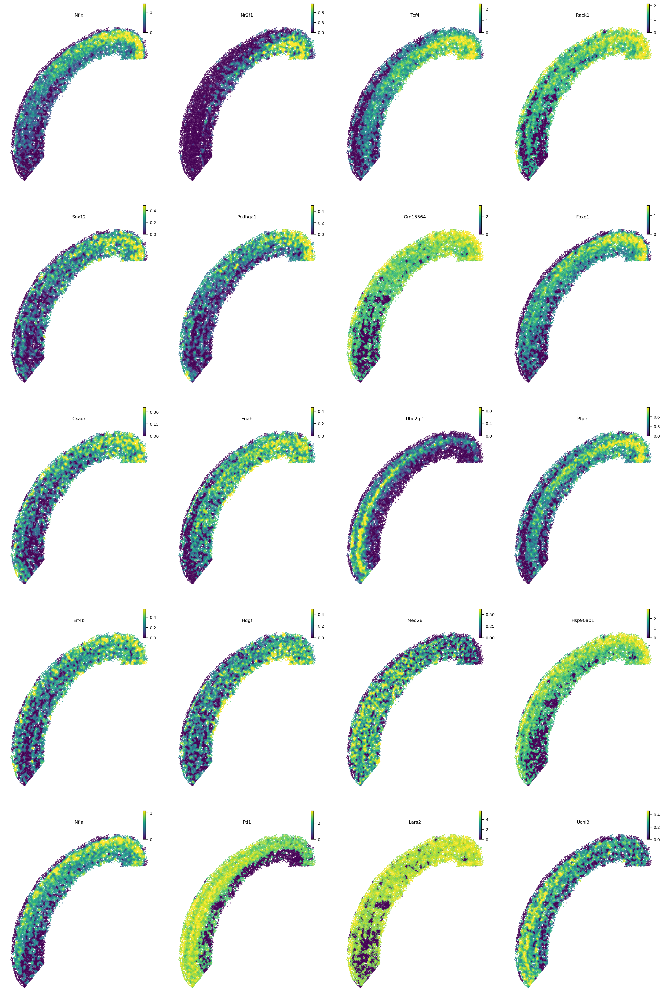

In [7]:
st.pl.space(e16_sm, color=sig_df.sort_values(by='log2fc', ascending=False).index[0:20], pointsize=0.1, show_legend="upper left", space='spatial')

## Identify genes have similar spatial expression patterns to specific genes

In [8]:
e16_gene_w, _ = st.svg.cal_wass_dis_target_on_genes(e16, n_neighbors=8, target_genes=["Neurod1", 'Fabp7'], processes=7, bootstrap=100, min_dis_cutoff=500, max_dis_cutoff=1000,)

|-----> Start computing neighbor graph...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> <insert> spatial_connectivities to obsp in AnnData Object.
|-----> <insert> spatial_distances to obsp in AnnData Object.
|-----> <insert> spatial_neighbors to uns in AnnData Object.
|-----> <insert> spatial_neighbors.indices to uns in AnnData Object.
|-----> <insert> spatial_neighbors.params to uns in AnnData Object.
|-----> The cell/buckets number after filtering by min_dis_cutoff is 400
|-----> The cell/buckets number after filtering by max_dis_cutoff is 400
|-----> Start computing neighbor graph...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> <insert> spatial_connectivities to obsp in AnnData Object.
|-----> <insert> spatial_distances to obsp in AnnData Object.
|-----> <insert> spatial_neighbors to uns in AnnData Object.
|-----> <insert> spatial_neighbors.indices to uns in 

100%|██████████| 100/100 [00:07<00:00, 14.00it/s]


|-----> Start computing neighbor graph...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> <insert> spatial_connectivities to obsp in AnnData Object.
|-----> <insert> spatial_distances to obsp in AnnData Object.
|-----> <insert> spatial_neighbors to uns in AnnData Object.
|-----> <insert> spatial_neighbors.indices to uns in AnnData Object.
|-----> <insert> spatial_neighbors.params to uns in AnnData Object.
|-----> The cell/buckets number after filtering by min_dis_cutoff is 400
|-----> The cell/buckets number after filtering by max_dis_cutoff is 400
|-----> Start computing neighbor graph...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> <insert> spatial_connectivities to obsp in AnnData Object.
|-----> <insert> spatial_distances to obsp in AnnData Object.
|-----> <insert> spatial_neighbors to uns in AnnData Object.
|-----> <insert> spatial_neighbors.indices to uns in 

100%|██████████| 100/100 [00:12<00:00,  7.70it/s]


In [9]:
# Top 10 genes are similar to Neurod1
e16_gene_w['Neurod1'].sort_values(by='Wasserstein_distance').head(10)

,Wasserstein_distance,positive_ratio,mean,std,zscore,pvalue,adj_pvalue,fc,log2fc,-log10adjp
gene_id,,,,,,,,,,
Neurod1,0.000000,0.2400,426.566569,110.729600,-3.852326,0.000059,0.005077,0.000000,-inf,2.294414
Epha3,109.124797,0.5200,407.132366,80.676812,-3.693844,0.000110,0.008688,0.268033,-1.899519,2.061098
Phf21b,114.516812,0.5675,404.575468,84.986447,-3.412999,0.000321,0.019514,0.283054,-1.820849,1.709653
Mef2d,122.587974,0.1975,459.033970,158.322466,-2.125068,0.016790,0.072109,0.267056,-1.904783,1.142008
Ccdc88c,144.452329,0.7150,393.574910,59.047196,-4.219042,0.000012,0.001214,0.367026,-1.446045,2.915882
2510009E07Rik,146.244516,0.3150,434.941081,102.262324,-2.823098,0.002378,0.046562,0.336240,-1.572437,1.331973
2700081O15Rik,152.519340,0.7075,404.019346,65.160622,-3.859693,0.000057,0.004983,0.377505,-1.405432,2.302511
D630045J12Rik,153.715651,0.2525,443.881697,127.091730,-2.283123,0.011212,0.072109,0.346299,-1.529911,1.142008
Mex3a,154.838818,0.7200,390.877699,53.383862,-4.421540,0.000005,0.000495,0.396131,-1.335950,3.305589


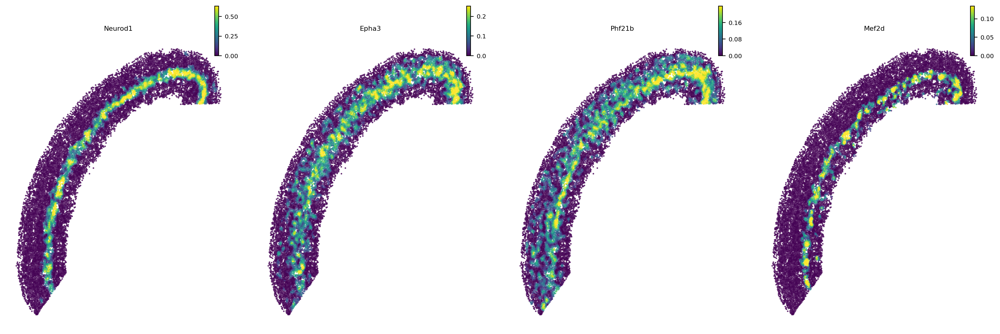

In [10]:
# Show example genes
st.pl.space(e16_sm, color=['Neurod1', 'Epha3', 'Phf21b', 'Mef2d'], pointsize=0.1, show_legend="upper left", space='spatial')

In [11]:
# Top 10 genes are similar to Fabp7
e16_gene_w['Fabp7'].sort_values(by='Wasserstein_distance').head(10)

,Wasserstein_distance,positive_ratio,mean,std,zscore,pvalue,adj_pvalue,fc,log2fc,-log10adjp
gene_id,,,,,,,,,,
Fabp7,0.000000,0.7125,382.119183,80.226183,-4.763023,9.535687e-07,0.000093,0.000000,-inf,4.029442
Lockd,53.788738,0.5100,381.800645,82.260702,-3.987468,3.339112e-05,0.002568,0.140882,-2.827444,2.590429
Hmgn2,59.864920,0.7050,374.260007,60.587304,-5.189125,1.056423e-07,0.000011,0.159955,-2.644258,4.976164
Ccdc115,61.983720,0.5025,386.175798,85.063690,-3.811169,6.915565e-05,0.004761,0.160506,-2.639297,2.322344
Nmt1,67.239757,0.3550,395.432131,90.707347,-3.618145,1.483608e-04,0.008274,0.170041,-2.556044,2.082264
H2afz,70.602171,0.7025,374.652324,65.553335,-4.638210,1.757196e-06,0.000169,0.188447,-2.407768,3.772945
Zbtb20,71.213793,0.4050,391.138576,92.670357,-3.452288,2.779268e-04,0.013528,0.182068,-2.457451,1.868767
Pea15a,73.291279,0.7150,375.614612,67.891255,-4.453053,4.232900e-06,0.000394,0.195124,-2.357540,3.404964
H2afv,76.786626,0.7125,368.835558,54.667684,-5.342259,4.589767e-08,0.000005,0.208187,-2.264051,5.333889


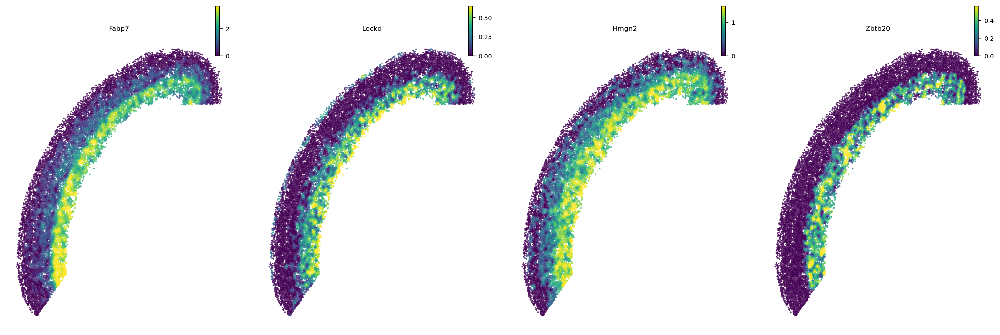

In [12]:
# Show example genes
st.pl.space(e16_sm, color=['Fabp7', 'Lockd', 'Hmgn2', 'Zbtb20'], pointsize=0.1, show_legend="upper left", space='spatial')